In [3]:
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
import imgaug.augmenters as iaa
from matplotlib.colors import LogNorm
from matplotlib.gridspec import GridSpec

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
print(torch.cuda.current_device())

cuda
0


In [4]:
def label_images(images, labels):
    #this function takes shape (batch_size, 784) images and shape (batch_size) labels and returns label-embedded images, with shape (batch_size, 784)
    images=images.clone()
    for img,label in zip(images,labels):
        #img[0:10]=0 
        img[label]=2.5       
    return images

def image_aug(x,y,times=1):
    size=len(x)
    x_aug=x.clone()
    y_aug=y.clone()
    for i in range(times):
        x_jittered = seq(images=x.cpu().numpy().reshape(size,28,28))
        x_jittered=torch.from_numpy(x_jittered).reshape(size,28*28)
        x_aug=torch.cat((x_aug,x_jittered),dim=0)
        y_aug=torch.cat((y_aug,y))
    return x_aug,y_aug

In [5]:
print("Download dataset and init dataloader..")
torch.manual_seed(0)
transform = torchvision.transforms.Compose([torchvision.transforms.ToTensor(), torchvision.transforms.Normalize((0.1307,), (0.3081,)), torchvision.transforms.Lambda(torch.flatten)])
trainset = torchvision.datasets.MNIST('./data/', transform=transform,  train=True, download=True)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=60000, shuffle=True)
testset = torchvision.datasets.MNIST('./data/', transform=transform, train=False, download=True)
testloader = torch.utils.data.DataLoader(testset, batch_size=10000, shuffle=False)
print("Done")

Download dataset and init dataloader..
Done


## Image preprocessing

In [6]:
print("Move train data to device")
x, y = next(iter(trainloader))
#x,y = image_aug(x,y,1)
print(x.size())
x=x.to(device)
y=y.to(device)
print("Generate positive and negative train data")
rnd = torch.randperm(x.size(0))
x_pos = label_images(x, y).to(device)
x_neg = label_images(x, y[rnd]).to(device)
print("Move test data to device")
x_te, y_te = next(iter(testloader))
x_te=x_te.to(device)
y_te=y_te.to(device)
print("Generate labelled test data")
x_te_labelled=label_images(x_te, y_te)

Move train data to device
torch.Size([60000, 784])
Generate positive and negative train data
Move test data to device
Generate labelled test data


## Positive and negative data sample

Text(0.5, 1.0, 'Negative data')

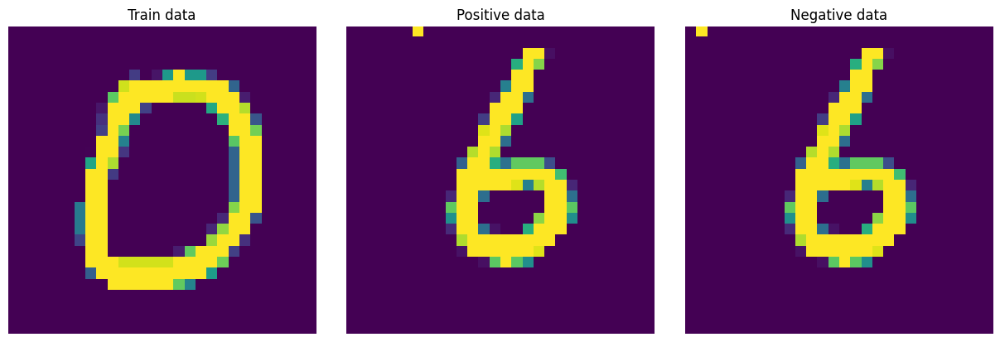

In [7]:
fig, ax = plt.subplots(1,3,figsize=(12,4),dpi=100)
plt.subplots_adjust(left=0.0,
                    bottom=0.0,
                    right=0.99,
                    top=0.99,
                    wspace=0.1,
                    hspace=0.1)
for i in ax:
    i.axis('off')
ax[0].imshow(x_te[10].cpu().numpy().reshape(28,28), vmin=0,vmax=2)
ax[0].set_title('Train data')
ax[1].imshow(x_pos[8].cpu().numpy().reshape(28,28), vmin=0,vmax=2)
ax[1].set_title('Positive data')
ax[2].imshow(x_neg[8].cpu().numpy().reshape(28,28), vmin=0,vmax=2)
ax[2].set_title('Negative data')

In [8]:
def normalize(x):
    return torch.nn.functional.normalize(x)

class ForwardLayer(torch.nn.Module):
    def __init__(self, in_features, out_features, custom_nlinear = torch.nn.ReLU(), goodness_function = lambda x : x.square().mean(1),threshold = 2,num_epochs=1000):
        super().__init__()
        self.linear = torch.nn.Linear(in_features, out_features)
        self.custom_nlinear = custom_nlinear
        self.goodness_function = goodness_function 
        self.optimizer = torch.optim.Adam(self.parameters(), lr=0.03)
        self.threshold = threshold
        #self.optimizer.param_groups.append({'params': self.threshold })
        self.num_epochs = num_epochs
        self.dropout=torch.nn.Dropout(p=0.5, inplace=False)
        
    def forward(self, x):
        x_direction = normalize(x)
        x_direction = self.custom_nlinear(self.linear(x_direction))
        #x_direction = self.dropout(x_direction)
        return x_direction

    def train_net(self, x_pos, x_neg,dep,ax,plot=False):
        positiveness=list()
        negativeness=list()
        for i in range(self.num_epochs):
            x_pos_output=self.forward(x_pos)
            x_neg_output=self.forward(x_neg)
            positive_goodness = self.goodness_function(x_pos_output)
            negative_goodness = self.goodness_function(x_neg_output)
            
           # l = torch.log(1 + torch.exp(torch.cat([
           #     -positive_goodness + self.threshold,
           #     negative_goodness - self.threshold]))).mean()
            l = torch.cat((-positive_goodness,negative_goodness)).mean()
            self.optimizer.zero_grad()
            l.backward()
            self.optimizer.step()
            if plot:
                negativeness.append(negative_goodness.mean().cpu().detach())
                positiveness.append(positive_goodness.mean().cpu().detach())
        if plot:
            ax[dep].plot(negativeness,'-',lw=2,label="Negative", markersize=3)
            ax[dep].plot(positiveness,'-',lw=2,label="Positive", markersize=3)
            if dep==2:
                ax[dep].set_xlabel("Epoch")
                ax[dep].legend()
            ax[dep].set_ylabel("Activations")
            ax[dep].set_title(f"Layer {dep+1}")
            ax[dep].grid()
            #ax[dep].set_ylim([0,1])
            
        return self.forward(x_pos).detach(), self.forward(x_neg).detach()
    
class Net(torch.nn.Module):

    def __init__(self, dimensions, custom_nlinear = torch.nn.ReLU(), goodness_function = lambda x : x.square().mean(1),threshold = 20,num_epochs=1000):
        super().__init__()
        self.layers = torch.nn.ModuleList([ForwardLayer(dimensions[i], dimensions[i + 1], custom_nlinear, goodness_function,threshold,num_epochs) for i in range(len(dimensions)-1)])
        self.goodness_function=goodness_function
        return 
    
    def label_images(self,x,label):
        x=x.clone()
        for img in x:
            #img[0:10]=0.1
            img[label]=2.5      
        return x
        
    def predict(self, x,exclude_first=False):
        goodness_per_label = []
        for label in range(10):            
            x_lab = self.label_images(x, label)
            goodness = []
            for i, layer in enumerate(self.layers):
                x_lab = layer(x_lab)
                if not (i==0 and exclude_first==True):
                    goodness.append(self.goodness_function(x_lab))
            goodness_per_label.append(sum(goodness).unsqueeze(1))
            
        goodness_per_label = torch.cat(goodness_per_label, 1)
        return torch.argmax((goodness_per_label), dim=1)
            
    def predict_filtered(self, x,my_filter):
        goodness_per_label = []
        for label in range(10):            
            x_lab = self.label_images(x, label)
            goodness = []
            for i, layer in enumerate(self.layers):
                x_lab = layer(x_lab)
                goodness.append(self.goodness_function(x_lab[:,my_filter[i][label]]))
            goodness_per_label.append(sum(goodness).unsqueeze(1))
        goodness_per_label = torch.cat(goodness_per_label, 1)
        return torch.argmax((goodness_per_label), dim=1)
                
    
    def predict_activations(self, x):
        activations_values_single_label=x.detach().cpu().clone()
        for i, layer in enumerate(self.layers):
            x = layer(x)
            activations_values_single_label=torch.cat((activations_values_single_label,x.detach().cpu()),1)
        return activations_values_single_label
    
    
    def train_net(self, x_pos, x_neg,plot=False):
        ax=None
        if plot:
            fig, ax = plt.subplots(len(self.layers),1,figsize=(13,7),dpi=300,sharex=True)
        i=0
        for layer in self.layers:
            x_pos, x_neg = layer.train_net(x_pos, x_neg,i,ax,plot=plot)
            i+=1
        plt.show() 

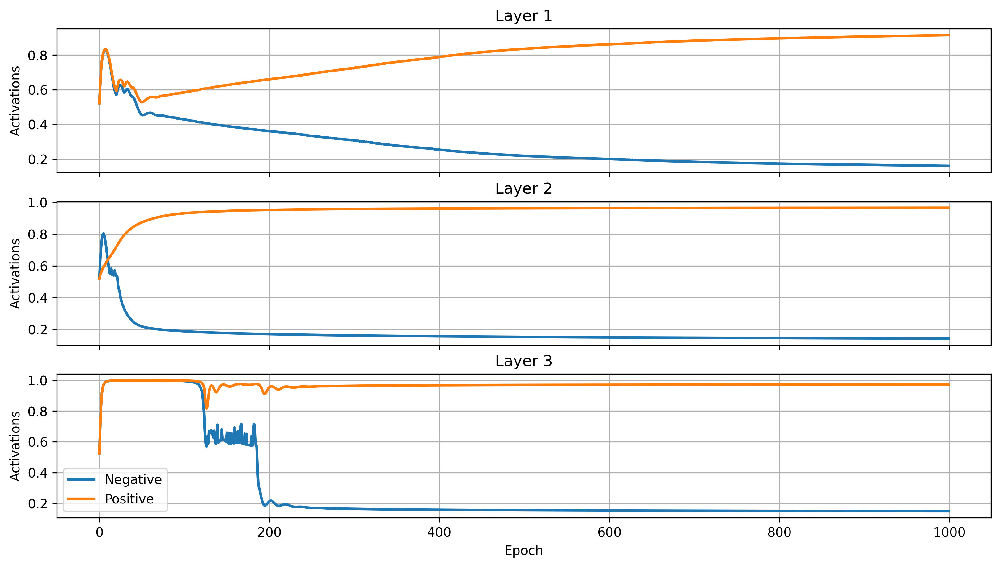

Train accuracy: 0.9337999820709229
Test accuracy: 0.9262999892234802
CPU times: user 6min 12s, sys: 687 ms, total: 6min 13s
Wall time: 6min 13s


In [10]:
%%time
net = Net([784, 784, 784, 784],
          torch.sigmoid,lambda x  : torch.norm(x,dim=1,p=torch.inf),num_epochs=1000).to(device)

net.train_net(x_pos, x_neg,True)
net.eval()
for i in net.layers:
    i.eval()
print('Train accuracy:', net.predict(x).eq(y).float().mean().item())
print('Test accuracy:', net.predict(x_te).eq(y_te).float().mean().item())

In [8]:
print('Train accuracy:', net.predict(x,exclude_first=True).eq(y).float().mean().item())
print('Test accuracy:', net.predict(x_te,exclude_first=True).eq(y_te).float().mean().item())

Train accuracy: 0.9155833721160889
Test accuracy: 0.9149999618530273


In [11]:
def plot_heatmap(result,layers):
    fig, ax = plt.subplots(1,layers,figsize=(12,4),dpi=300)
    plt.subplots_adjust(left=0.0,
                    bottom=0.0,
                    right=0.99,
                    top=0.9,
                    wspace=0.1,
                    hspace=0.1)
    
    for i in range(layers):
        heatmap_layer=result[:,i*784:(i+1)*784]
        heatmap_layer_mean=torch.mean(heatmap_layer,0)
        if i==0:
            ax[i].imshow(heatmap_layer_mean.reshape(28,28), vmin=0,vmax=2)
        else:
            ax[i].imshow(heatmap_layer_mean.reshape(28,28), vmin=0,vmax=0.8)
            ax[i].set_title(f'Layer {i}')
        ax[i].axis('off')
        
def plot_histogram(result,layers):
    fig, ax = plt.subplots(1,layers-1,figsize=(12,4),dpi=300,sharey=True)
    fig.tight_layout(pad=.5)
    for i in range(1,layers):
        heatmap_layer=result[:,i*784:(i+1)*784]
        heatmap_layer_mean=torch.mean(heatmap_layer,0)
        if i==0:
            ax[i].imshow(heatmap_layer_mean.reshape(28,28), vmin=0,vmax=2)
            ax[i].axis('off')
        else:
            i-=1
            ax[i].hist(heatmap_layer_mean,bins=80, log=True)
            ax[i].set_xlim(0, 1)
            ax[i].set_xlabel("Activations")
            ax[i].grid()
            ax[i].set_title(f"Layer {i}")



def plt_activations(result,layers):
    fig, ax = plt.subplots(1,layers,figsize=(12,4),dpi=300,sharex=True)
    plt.subplots_adjust(left=0.1,
                    bottom=0.0,
                    right=0.9,
                    top=0.9,
                    wspace=0.1,
                    hspace=0.1)
    
    for i in range(layers):
        heatmap_layer=result[:,i*784:(i+1)*784]
        if i==0:
            ax[i].imshow(heatmap_layer, vmin=0,vmax=2)
        else:
            ax[i].set_title(f"Layer {i}")
            ax[i].imshow(heatmap_layer, vmin=0,vmax=1)
        ax[i].axis('off')


## Activations value over the dataset

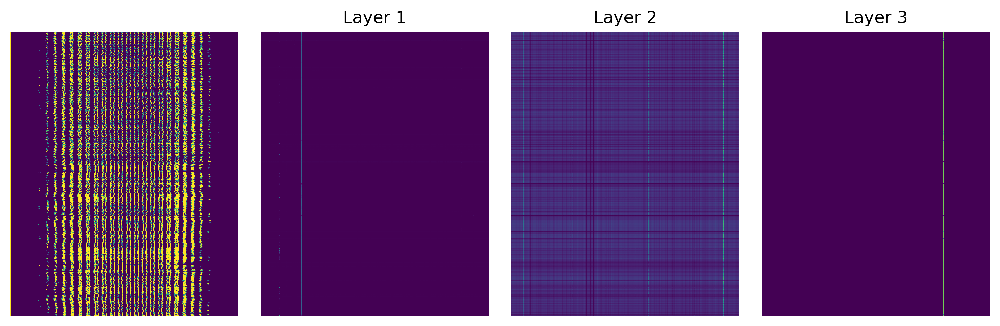

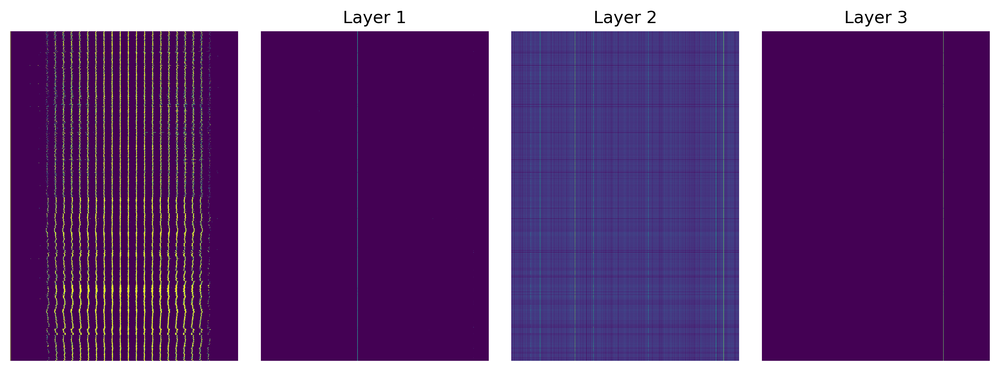

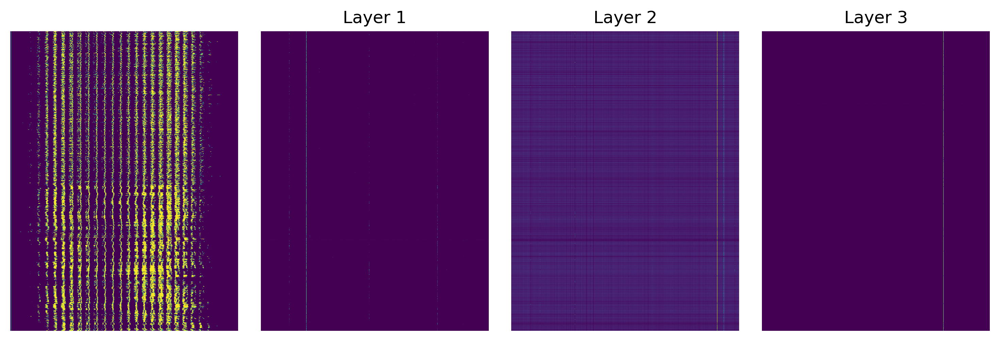

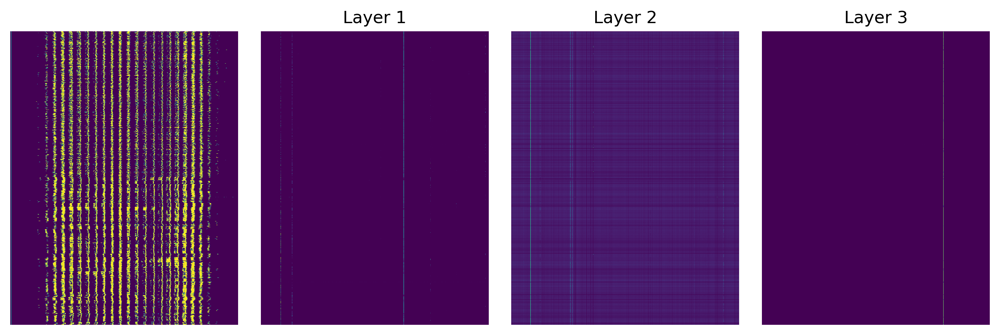

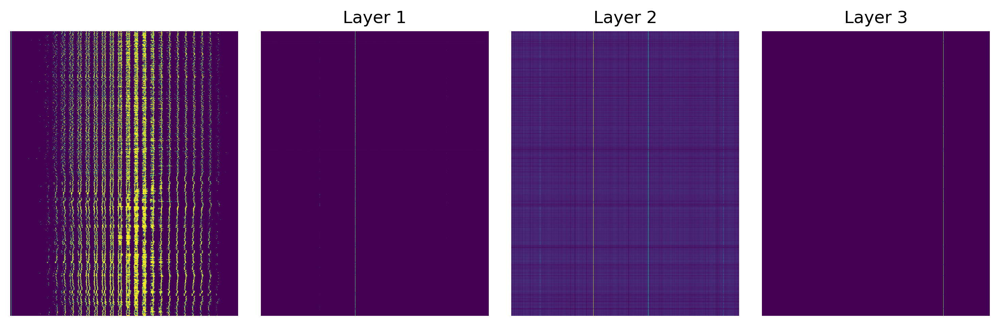

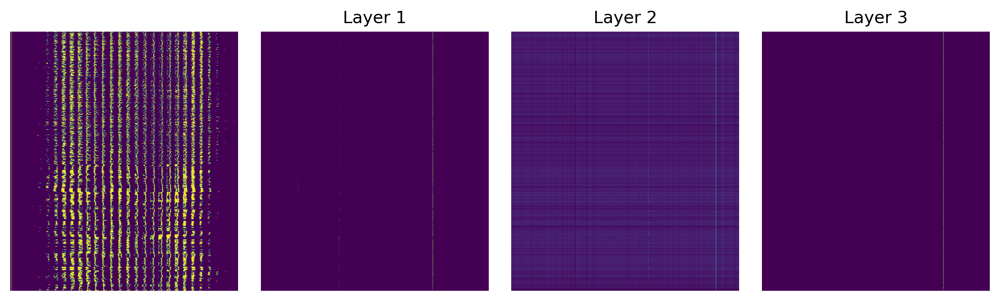

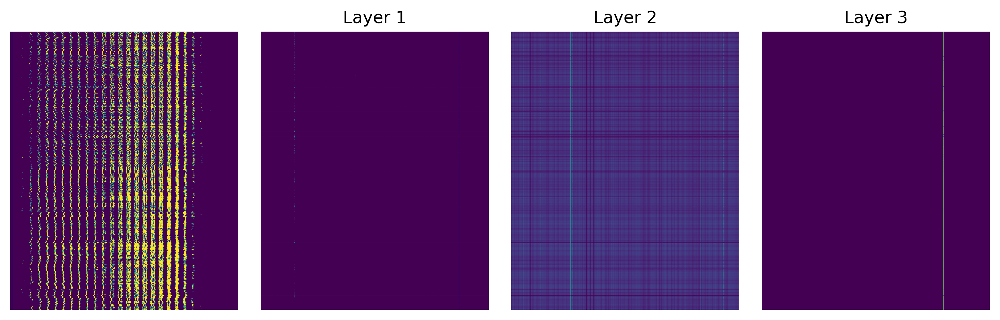

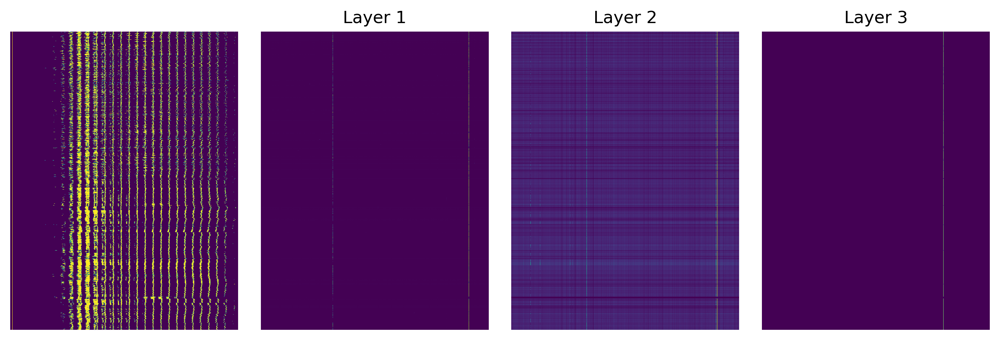

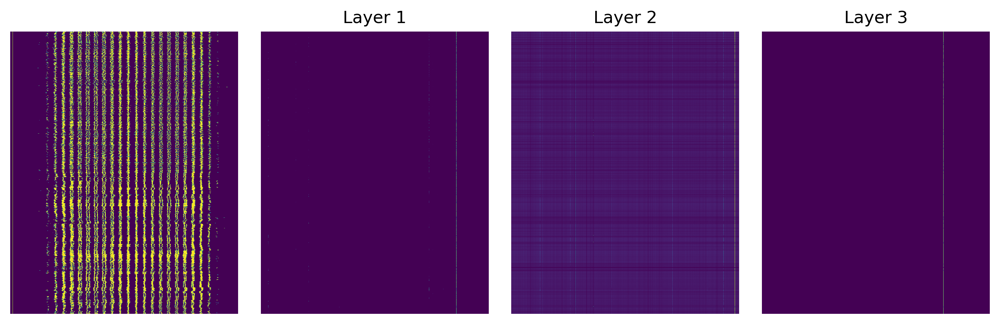

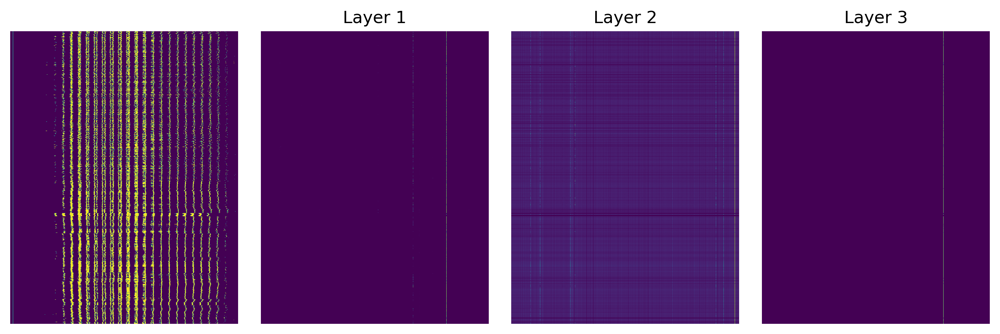

In [12]:
for i in range(0,10):
        mask = y_te == i
        x_tmp=x_te[mask].clone()
        x_tmp=label_images(x_tmp,y_te[mask])
        res=net.predict_activations(x_tmp)
        plt_activations(res,4)

## Activations heatmap over the dataset

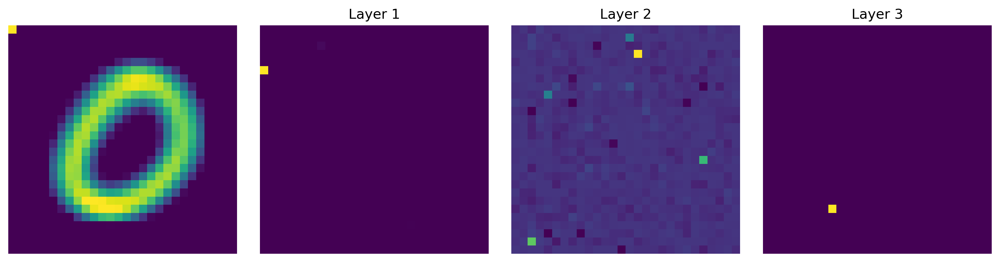

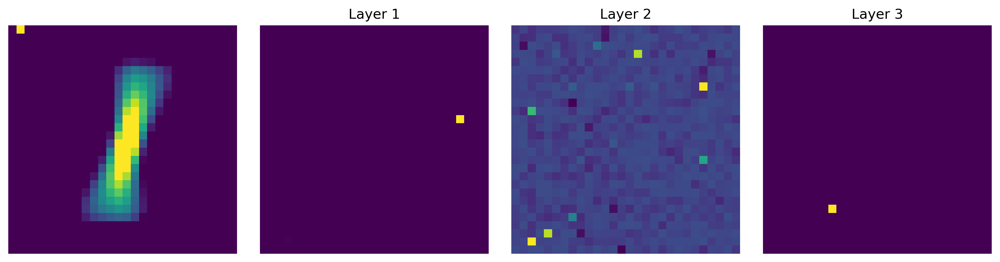

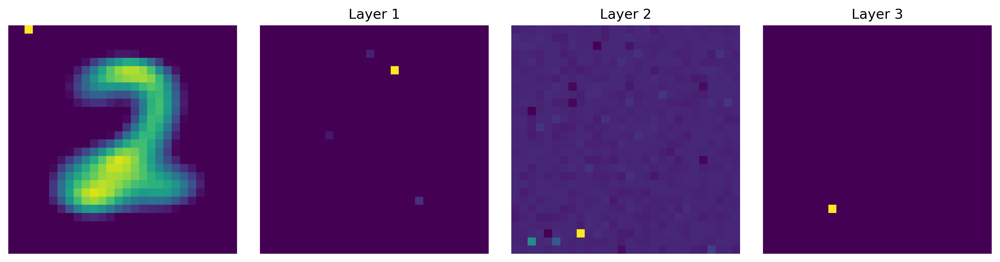

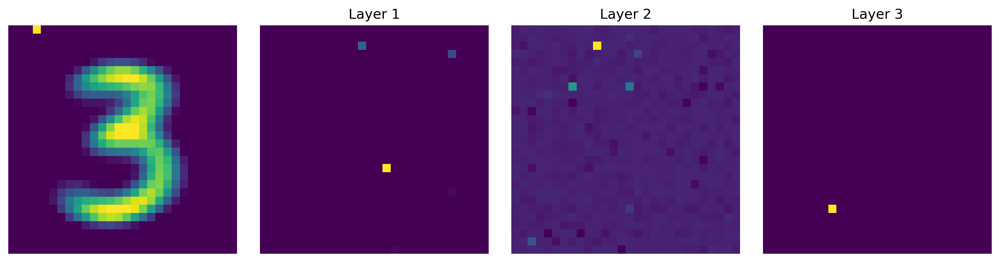

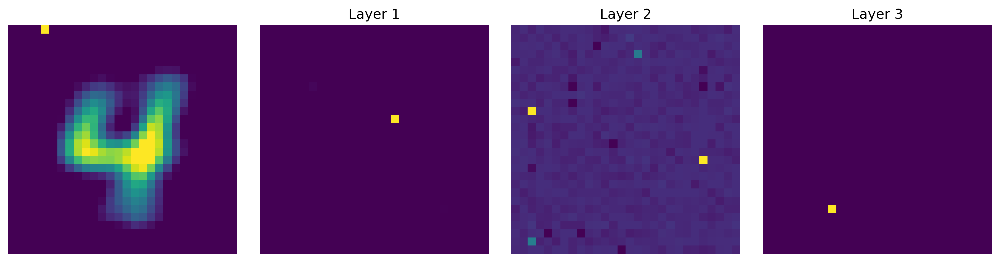

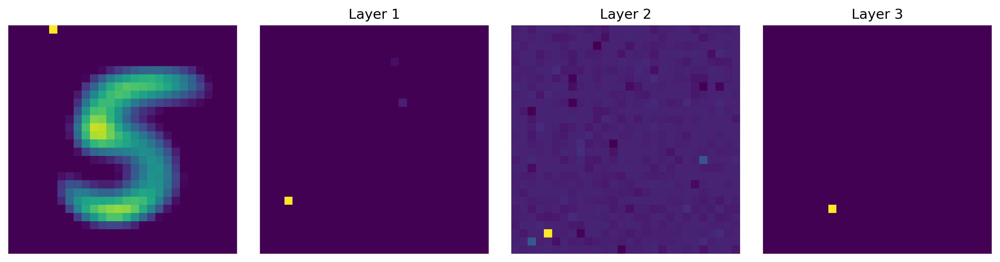

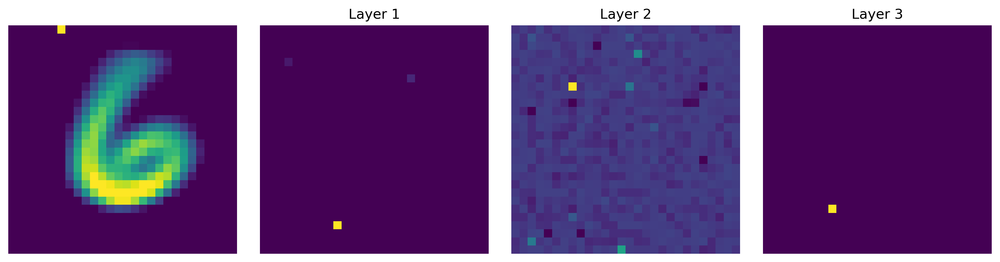

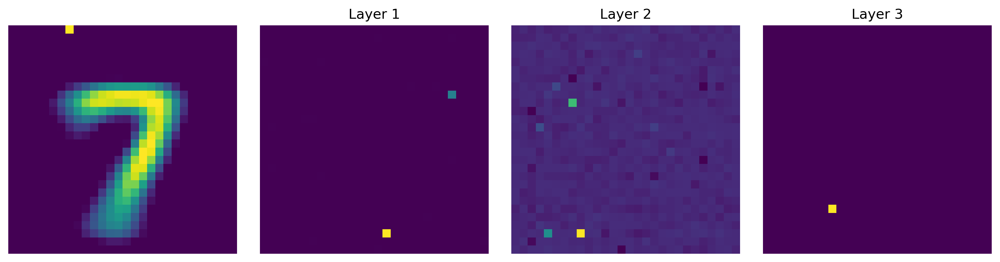

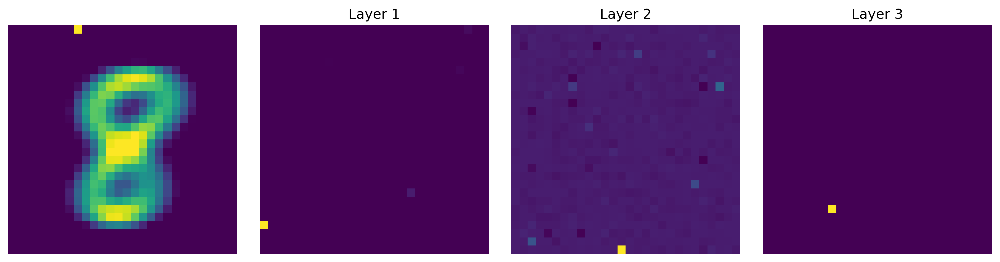

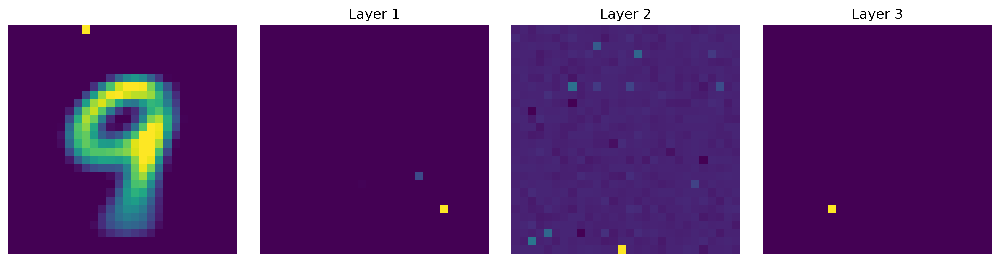

In [13]:
for i in range(0,10):
        mask = y_te == i
        x_tmp=x_te[mask].clone()
        x_tmp=label_images(x_tmp,y_te[mask])
        res=net.predict_activations(x_tmp)
        plot_heatmap(res,4)
        

## Activations histogram over the dataset

In [ ]:

plt.rcParams.update({'font.size': 16})
for i in range(0,10):
        mask = y_te == i
        x_tmp=x_te[mask].clone()
        x_tmp=label_images(x_tmp,y_te[mask])
        res=net.predict_activations(x_tmp)
        plot_histogram(res,4)

## Filtered prediction

In [14]:
def retrive_index(x_te_labelled,layers,threshold=0.2):
    locked_index=[set() for i in range(layers)]
    for i in range(0,10):
            mask = y_te == i
            selected = x_te_labelled[mask]
            res=net.predict_activations(selected)
            for layer in range(1,layers):
                single_layer=res[:,layer*784:(layer+1)*784]
                single_layer=torch.mean(single_layer,dim=0)
                mask = single_layer >= threshold
                index = mask.nonzero(as_tuple=True)[0]
                for v in index:
                    locked_index[layer].add((v.item(),i))
    return locked_index

def create_filter(locked_index):
    my_filter=list()
    for layer,locked in enumerate(locked_index):
        all_label=list()
        for label in range(10):
            mask=[i[0] for i in filter(lambda x: True if x[1] == label else False, locked)]
            all_label.append(mask)
        my_filter.append(all_label)
    return my_filter



In [15]:
locked_index=retrive_index(x_te_labelled,4,threshold=0.2)
for layer in range(1,4):
    print(f"Layer {layer} predictors:")
    print(locked_index[layer])

Layer 1 predictors:
{(247, 7), (332, 1), (591, 5), (715, 7), (681, 6), (491, 3), (140, 0), (68, 3), (638, 9), (672, 8), (156, 2), (324, 4)}
Layer 2 predictors:
{(733, 2), (210, 1), (651, 6), (730, 3), (730, 0), (228, 0), (456, 1), (30, 6), (730, 6), (471, 5), (730, 9), (704, 5), (203, 1), (282, 4), (282, 1), (210, 0), (210, 3), (353, 6), (210, 6), (730, 5), (708, 2), (730, 2), (730, 8), (471, 1), (99, 1), (99, 4), (471, 4), (66, 1), (704, 1), (769, 6), (769, 9), (203, 3), (704, 7), (203, 6), (203, 9), (213, 1), (221, 8), (651, 1), (730, 1), (42, 0), (730, 4), (259, 7), (708, 7), (471, 0), (99, 0), (219, 1), (66, 3), (42, 6), (99, 6), (769, 8), (66, 9), (99, 9), (704, 9), (404, 1), (89, 1)}
Layer 3 predictors:
{(624, 8), (624, 5), (624, 1), (624, 4), (624, 7), (624, 3), (624, 0), (624, 6), (624, 9), (624, 2)}


In [ ]:
my_filter=create_filter(locked_index)
print('Test accuracy filtered:', net.predict_filtered(x_te, my_filter).eq(y_te).float().mean().item())
print('Test accuracy:', net.predict(x_te).eq(y_te).float().mean().item())

## First layer weight inspection

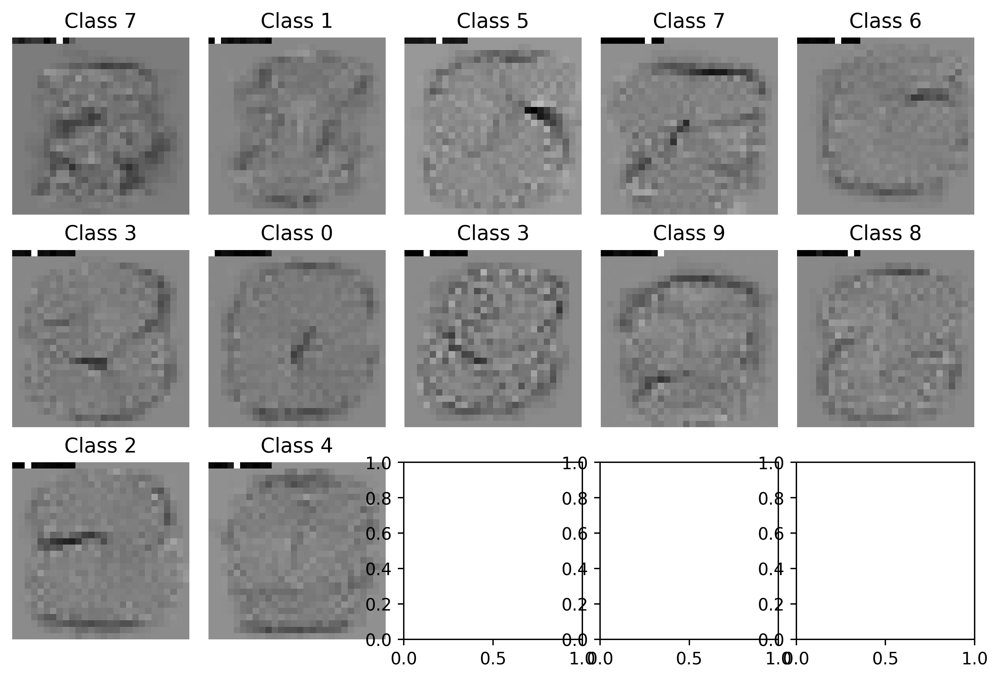

In [16]:
p = dict(net.named_parameters())

fig, ax = plt.subplots(3,5,figsize=(8,5),dpi=350)
plt.subplots_adjust(left=0.0,
                bottom=0.0,
                right=0.99,
                top=0.99,
                wspace=0.1,
                hspace=0.2)
idx=0
for tupla in locked_index[1]:
    ax.reshape(-1)[idx].imshow(p["layers.0.linear.weight"][tupla[0],:].cpu().detach().numpy().reshape(28,28),cmap="gray")
    ax.reshape(-1)[idx].set_title(f"Class {tupla[1]}")
    ax.reshape(-1)[idx].axis('off')
    idx+=1

In [ ]:
def compute_ids_scaling(X, N_min = 20):
    "instantiate data class"
    _data = data.Data(coordinates = X,
                     maxk = 100)
    "compute ids with twoNN + decimation"
    ids_twoNN, ids_err_twoNN, rs_twoNN = _data.return_id_scaling_2NN(N_min = N_min)
    return ids_twoNN, rs_twoNN


In [ ]:
measure_set = torchvision.datasets.MNIST('./data/', transform=torchvision.transforms.ToTensor(),  train=True, download=True)
measure_loader = torch.utils.data.DataLoader(measure_set, batch_size=60000, shuffle=True)

batch=1
for x,_ in measure_loader:
    x=x.numpy().reshape(-1,28*28)
    res=compute_ids_scaling(x,N_min=20)
    id_est=np.ceil(np.max(res[0]))
    batch+=1

In [ ]:
plt.plot(res[1],res[0])
id_est=np.ceil(np.mean(res[0]))
plt.title(f"TwoNN")
plt.ylim([0,30])


## Artificial data input

<Figure size 432x288 with 0 Axes>

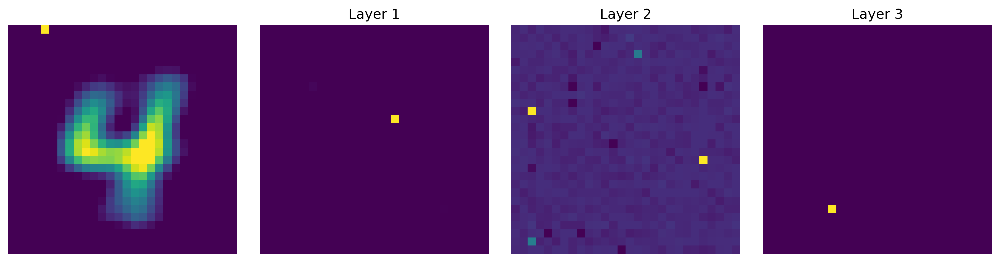

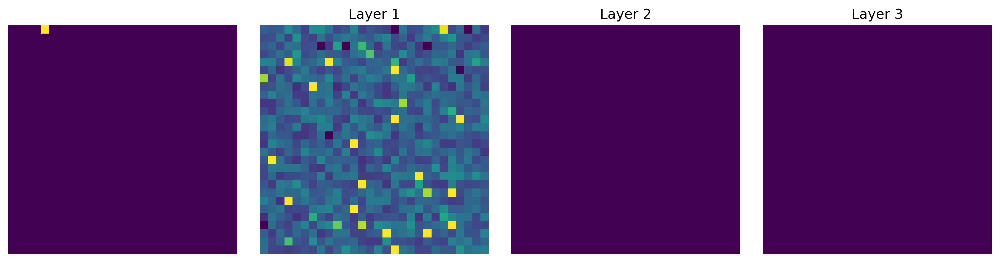

<Figure size 432x288 with 0 Axes>

In [17]:
mask = y_te == 4
x_tmp=x_te[mask].clone()
x_tmp=label_images(x_tmp,y_te[mask])
res=net.predict_activations(x_tmp)
plot_heatmap(res,4)

x_tmp=label_images(x_tmp,y_te[mask])
x_tmp[:,11:]=0.000
res=net.predict_activations(x_tmp[0:10])
plot_heatmap(res,4)
plt.figure()


Layer 1 predictors:
{(247, 7), (332, 1), (591, 5), (715, 7), (681, 6), (491, 3), (140, 0), (68, 3), (638, 9), (672, 8), (156, 2), (324, 4)}
Layer 2 predictors:
{(730, 0), (228, 0), (730, 6), (730, 9), (704, 5), (282, 4), (282, 1), (210, 3), (210, 6), (708, 2), (730, 2), (471, 1), (99, 1), (99, 4), (471, 4), (66, 1), (704, 1), (769, 6), (769, 9), (203, 3), (704, 7), (203, 6), (203, 9), (221, 8), (651, 1), (730, 1), (42, 0), (730, 4), (259, 7), (708, 7), (471, 0), (99, 0), (219, 1), (66, 3), (99, 6), (769, 8), (99, 9), (704, 9)}
Layer 3 predictors:
{(624, 8), (624, 5), (624, 1), (624, 4), (624, 7), (624, 3), (624, 0), (624, 6), (624, 9), (624, 2)}


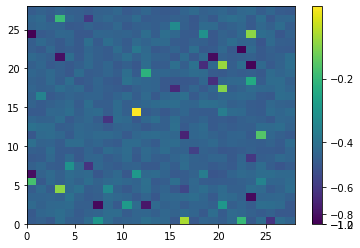

In [23]:
locked_index=retrive_index(x_te_labelled,4,threshold=0.25)

from matplotlib.colors import PowerNorm
for layer in range(1,4):
    print(f"Layer {layer} predictors:")
    print(locked_index[layer])

#Scelgo un threshold, poi guardo i predictor del primo layer e ne ispeziono i pesi
id_neurone=22
heatmap = plt.pcolor(p["layers.1.linear.weight"][id_neurone,:].cpu().detach().numpy().reshape(28,28),norm=PowerNorm(gamma=2))
plt.colorbar(heatmap)

## Neutral label classification

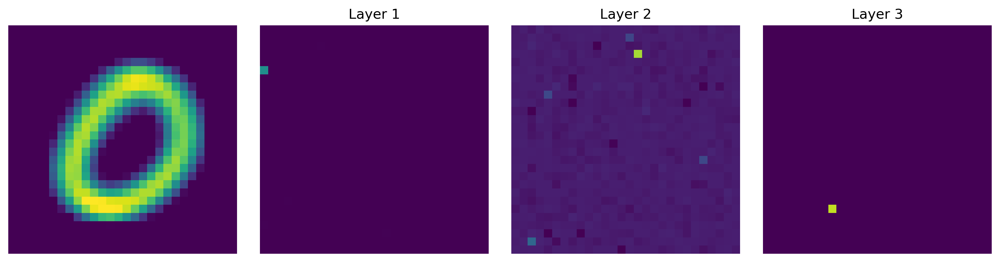

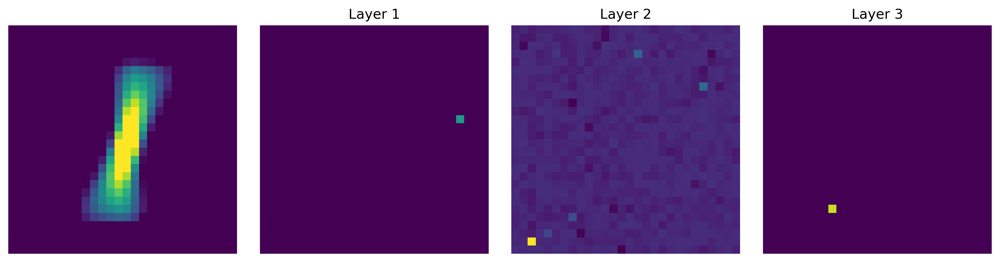

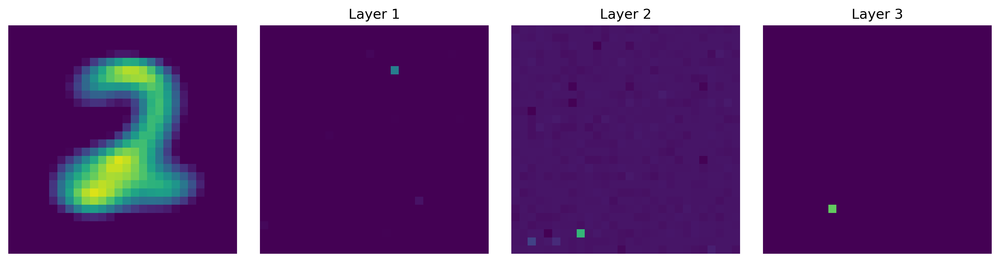

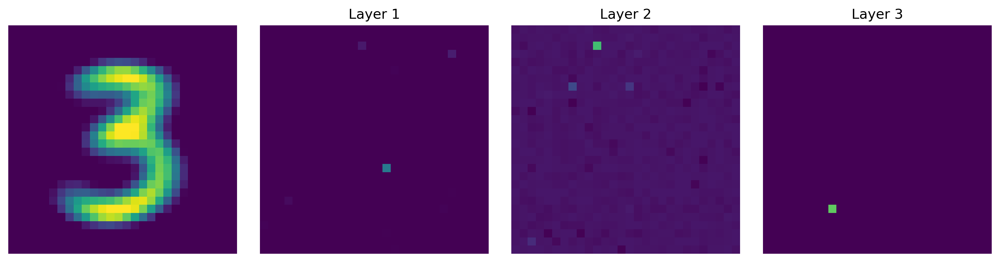

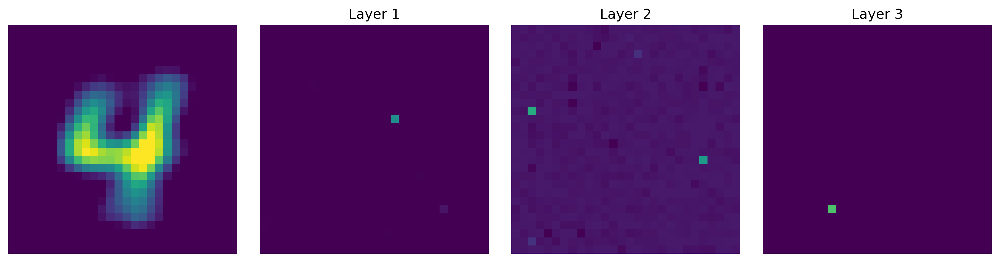

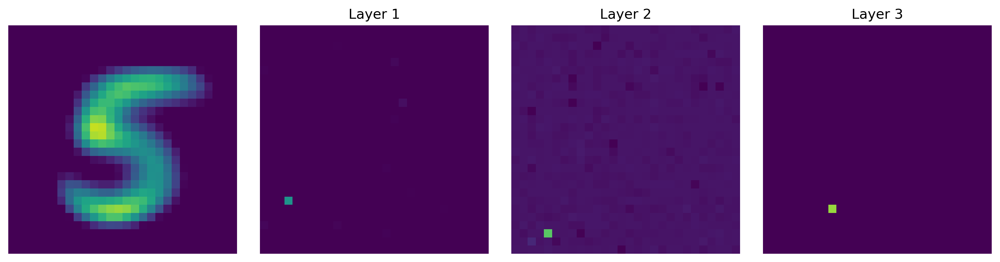

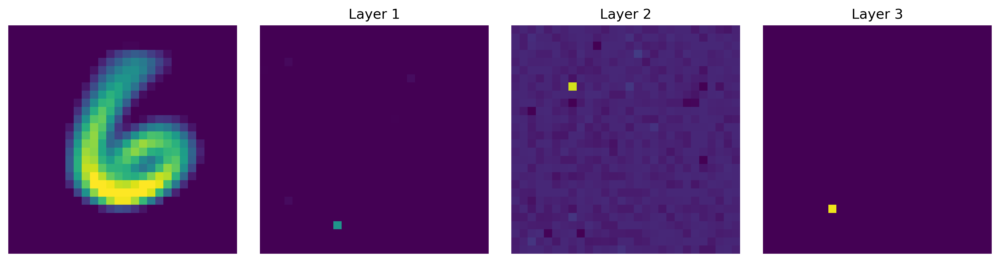

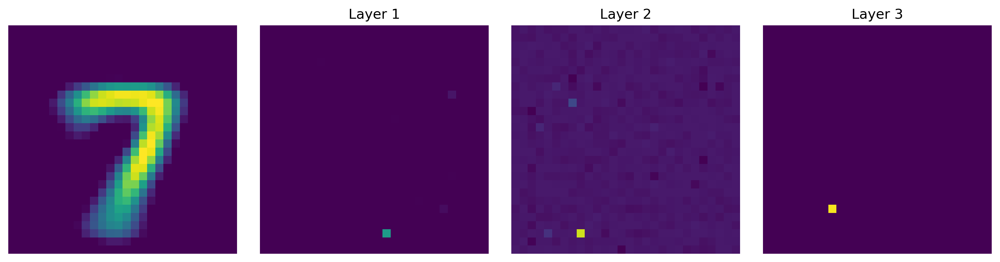

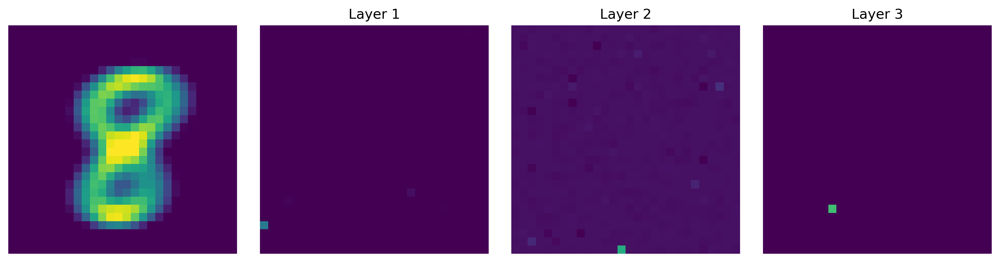

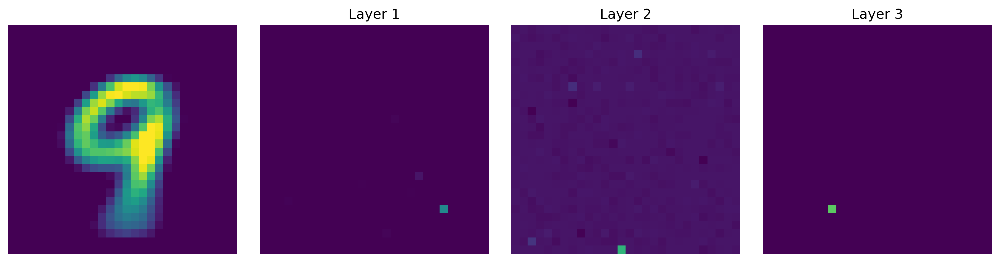

In [21]:
for i in range(0,10):
        mask = y_te == i
        x_tmp=x_te[mask].clone()
        #x_tmp=label_images(x_tmp,y_te[mask])
        res=net.predict_activations(x_tmp)
        plot_heatmap(res,4)

## Softmax classifier 

In [ ]:
class HeadClassifier(torch.nn.Module):
    def __init__(self,forward_net,layers):
        super().__init__()
        self.forward_net=forward_net
        self.layer1 = torch.nn.Linear(in_features=28*28*(layers), out_features=10, bias=False)
        self.activation = torch.nn.Sigmoid()
        self.softmax = torch.nn.Softmax(dim=1)
        for name,param in self.forward_net.named_parameters():
            param.requires_grad=False
            
    def forward(self, x):
        x=self.forward_net.predict_activations(x).to(device)
        x=x[:,1*28*28:]
        x=self.softmax(self.activation(self.layer1(x)))
        return x
    
    def get_accuracy(self,testloader):
        with torch.no_grad():
            correct=0
            for x, y in iter(testloader):
                x=x.to(device)
                y=y.to(device)
                out=self(x)
                correct+=(torch.argmax(out, axis=1)==y).sum()
            return correct/len(testloader.dataset)

model=HeadClassifier(net,3).to(device)

In [ ]:
model.load_state_dict(torch.load("very_nice_model.pt"))
optimizer=torch.optim.Adam(model.parameters(), lr=0.01)604
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max',verbose=True, factor=0.8, patience=5)
epochs=2
loss=torch.nn.CrossEntropyLoss( reduction='sum')

for epoch in range(epochs):     
    print("Epoch: ", epoch,end=" ")
    accuracy=model.get_accuracy(testloader)
    print("Test accuracy: ",accuracy )
    for x, y in iter(trainloader):
        x=x.to(device)
        y=y.to(device)
        out=model(x)
        l=loss(out, y)
        optimizer.zero_grad()
        l.backward()
        optimizer.step()
    scheduler.step(accuracy)
    
print("Final accuracy: ",  model.get_accuracy(testloader))

## Extra: visualization of the neurons activations video

In [ ]:
import numpy as np
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from IPython.display import HTML
from tqdm import tqdm
import time

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

res=net.predict_activations(x_te)
num_layers=4
num_frames=len(res)
bar = tqdm(range(num_frames), bar_format="{percentage:3.0f}% |{bar}| {elapsed}/{remaining}", position=0, leave=False)
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'


fig, (ax0,ax1,ax2,ax3) = plt.subplots(1,num_layers,figsize=(30,10),dpi=100)
plt.subplots_adjust(left=0.0,
                    bottom=0.0,
                    right=0.99,
                    top=0.9,
                    wspace=0.1,
                    hspace=0.1)

line0 = ax0.imshow(x[0].cpu().numpy().reshape(28,28), vmin=0,vmax=2)
line1 = ax1.imshow(x[0].cpu().numpy().reshape(28,28), vmin=0,vmax=2)
line2 = ax2.imshow(x[0].cpu().numpy().reshape(28,28), vmin=0,vmax=2)
line3 = ax3.imshow(x[0].cpu().numpy().reshape(28,28), vmin=0,vmax=2)


line = (line0,line1,line2,line3)
ax = (ax0,ax1,ax2,ax3)

for i in range(num_layers):
    ax[i].axis('off')
    if i==0:
        ax[0].set_title('Image')
    else:
        ax[i].set_title(f'Layer {i}')
        
def run(frame):
    bar.update()
    for i in range(num_layers):
        heatmap_layer=res[frame,i*784:(i+1)*784]
        if i==0:
            line[0].set_array(heatmap_layer.reshape(28,28))
        else:
            line[i].set_array(heatmap_layer.reshape(28,28))
    return line

print("Start animation rendering")
anim = animation.FuncAnimation(fig, run,  interval=10,frames=50)
HTML(anim.to_html5_video())
print("end animation")
writervideo = animation.FFMpegWriter(fps=30)
print("Go to ffmpeg save")
anim.save(f'Final_activation.mp4', writer=writervideo)

In [ ]:
HTML(anim.to_html5_video())

In [ ]:
locked_index=retrive_index(x_te_labelled,4,threshold=0.2)
from matplotlib.colors import PowerNorm
for layer in range(1,4):
    print(f"Layer {layer} predictors:")
    print(locked_index[layer])
    
#plt.imshow(p["layers.1.linear.weight"][413,:].cpu().detach().numpy().reshape(28,28),cmap="gray")
#plt.imshow(p["layers.1.linear.weight"][413,:].cpu().detach().numpy().reshape(28,28),norm=PowerNorm(gamma=0.5),cmap="gray")
heatmap = plt.pcolor(p["layers.1.linear.weight"][413,:].cpu().detach().numpy().reshape(28,28),norm=PowerNorm(gamma=3))
plt.colorbar(heatmap)

In [ ]:
zero=torch.zeros_like(p["layers.1.linear.weight"][413,:])
for t in locked_index[1]:
    zero[t[0]]=1
plt.imshow(zero.cpu().detach().numpy().reshape(28,28),)
plt.grid("off")